In [5]:
import pandas as pd

In [6]:
#Step_1: Read into a dataframe
#The given data is converted into csv (using an online converter), and fed into a Dataframe using the pandas.read_csv() method



In [7]:
week_df = pd.read_csv("data/weekMar23-29.csv")

In [8]:
#Step_2: Filter out Unnecessary Columns
#Certain columns (viz. Odometer, Other Ports, Data Received Time, IGN) contain redundant/null values. Removing these saves up memory and computation complexity in the long run.

#Though we ought to note that these columns, depending on the subsequent week's data or more, might contain valuable information and thus, be needed in the analysis. Therefore, we create a list of unneeded attribute names (for easy future adaptation).

In [9]:
unneeded_columns = ['Odometer', 'Other Ports', 'Data Received Time', 'IGN']
week_filtered_df = week_df.drop(columns=unneeded_columns) 

In [10]:
#Step_3: Satellite Data Filtering
#According the requirements set, records with [Satellites < 10] shall be filtered out. We

In [12]:
# making sure that each record's `Data String` attrib contains the `Satellites` param
week_filtered_df = week_filtered_df[week_filtered_df["Data String"].str.contains('Satellites')] 
# create a new column called "Satellites" containing the integral value from `Data String`
week_filtered_df['Satellites'] = week_filtered_df['Data String'].str.extract(r'\[Satellites=(\d+)\]', expand=False).astype(int)
MIN_SAT_NUM = 10 # future-proofing za work :)
week_satellite_adjusted_df = week_filtered_df[week_filtered_df["Satellites"] >= MIN_SAT_NUM] # final data w/ proper satellite >= 10 values

In [13]:
#Step_4: Extracting Other Attributes from the Data String
#From the final week_satellite_adjusted_df DataFrame, we can extract other meaningful attributes like Angle and Altitude

In [15]:
df = week_satellite_adjusted_df.copy() # too difficult to type the name, thus we shorten it :)
df = df[df["Data String"].str.contains('Angle')] 
df['Angle'] = df['Data String'].str.extract(r'\[Angle=(\d+)\]', expand=False).astype(int)
df = df[df["Data String"].str.contains('Altitude')] 
df['Altitude'] = df['Data String'].str.extract(r'\[Altitude=(\d+)\]', expand=False).astype(int)
# As a final task in this step, we format the lat and lon values into standard Decimal Degree Format
df['Latitude'] = df['Latitude'] / 1e7
df['Longitude'] = df['Longitude'] / 1e7
# df.to_csv("data/week1Output.csv")
df

,Latitude,Longitude,PWR,GPS,Speed,Data Actual Time,Data String,Satellites,Angle,Altitude
0,27.692507,85.315290,Off,On,0,22-03-2022 05:37:22 PM,FM4 [Priority=0] [GPS element=[X=853152900] [Y...,12,146,1308
2,27.680697,85.317760,On,On,0,23-03-2022 07:14:44 AM,FM4 [Priority=0] [GPS element=[X=853177600] [Y...,11,243,1302
3,27.680697,85.317760,Off,On,0,23-03-2022 07:16:07 AM,FM4 [Priority=1] [GPS element=[X=853177600] [Y...,11,243,1302
4,27.680697,85.317760,Off,On,0,23-03-2022 07:21:07 AM,FM4 [Priority=0] [GPS element=[X=853177600] [Y...,14,243,1302
6,27.679962,85.317422,On,On,0,23-03-2022 07:31:55 AM,FM4 [Priority=0] [GPS element=[X=853174216] [Y...,12,115,1319
...,...,...,...,...,...,...,...,...,...,...
12695,27.680447,85.317355,On,On,6,29-03-2022 02:24:13 PM,FM4 [Priority=0] [GPS element=[X=853173550] [Y...,14,195,1295
12696,27.680087,85.317172,On,On,18,29-03-2022 02:24:25 PM,FM4 [Priority=0] [GPS element=[X=853171716] [Y...,12,215,1292
12697,27.679377,85.316855,On,On,25,29-03-2022 02:24:37 PM,FM4 [Priority=0] [GPS element=[X=853168549] [Y...,12,195,1286
12698,27.678490,85.316488,On,On,23,29-03-2022 02:24:50 PM,FM4 [Priority=0] [GPS element=[X=853164883] [Y...,13,193,1288


In [16]:
#Step_5: Self-Exploration of Latitude and Longitudes using OSMnx (Visualization)
#This is jff (Just 4 Fun :))

In [18]:
import folium

# Center the map around the average point
center = [df['Latitude'].mean(), df['Longitude'].mean()]
m = folium.Map(location=center, zoom_start=13)

# Add GPS points with optional labels
for i, row in df.iterrows():
    color = ("green" if row['Speed'] < 20 else "orange" if row['Speed'] < 40 else "red")
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Point {i}, Speed {row['Speed']}",  # You can use any label: timestamp, IMEI, etc.
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.5,
        opacity=0.5
    ).add_to(m)

# folium.PolyLine(
#     locations=df[['Latitude', 'Longitude']].values.tolist(),
#     color='blue',
#     weight=2.5,
#     opacity=0.8
# ).add_to(m)

m.save('data/gps_map.html') # Save the map, if needed
m  # displays the map inline


In [19]:
#Perform Cubic Spline Interpolation to create a uniform timestamp data

In [21]:
#Step_6: Extraction of State from the df
#State of the vehicle can be one of idle, cruising, accelerating, decelerating. We extract this for every record based on its GPS, GPS of its immediate neighbours, and its current speed.

In [22]:
import numpy as np
from datetime import datetime

class VehicleStateAnalyzer:
    def __init__(self, idle_threshold=2, accel_threshold=2, time_window=2):
        """
        Initialize the analyzer with thresholds
        
        Parameters:
        - idle_threshold: Speed below which vehicle is considered idle (km/h)
        - accel_threshold: Speed change threshold for acceleration/retarding (km/h)
        - time_window: Number of records on each side to consider for context analysis
        """
        self.idle_threshold = idle_threshold
        self.accel_threshold = accel_threshold
        self.time_window = time_window
    
    def calculate_distance(self, lat1, lon1, lat2, lon2):
        """
        Calculate distance between two GPS points using Haversine formula (in meters)
        """
        from math import radians, cos, sin, asin, sqrt
        
        # Convert to radians
        lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
        
        # Haversine formula
        dlat = lat2 - lat1
        dlon = lon2 - lon1
        a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
        c = 2 * asin(sqrt(a))
        r = 6371000  # Earth radius in meters
        return c * r
    
    def analyze_vehicle_states(self, df):
        """
        Analyze vehicle states based on speed patterns and GPS movement
        
        Expected DataFrame columns:
        - Speed: Vehicle speed in km/h
        - Latitude: GPS latitude
        - Longitude: GPS longitude
        - Any timestamp column (optional)
        """
        if df.empty:
            return df
        
        df = df.copy()
        df = df.reset_index(drop=True)
        
        # Ensure we have the required columns
        required_cols = ['Speed', 'Latitude', 'Longitude']
        missing_cols = [col for col in required_cols if col not in df.columns]
        if missing_cols:
            raise ValueError(f"Missing required columns: {missing_cols}")
        
        # Calculate speed changes
        df['speed_change'] = df['Speed'].diff()
        
        # Calculate GPS distance moved between consecutive points
        df['distance_moved'] = 0.0
        for i in range(1, len(df)):
            df.loc[i, 'distance_moved'] = self.calculate_distance(
                df.loc[i-1, 'Latitude'], df.loc[i-1, 'Longitude'],
                df.loc[i, 'Latitude'], df.loc[i, 'Longitude']
            )
        
        # Calculate rolling statistics for context
        window_size = (self.time_window * 2) + 1  # Records on each side + current
        df['speed_rolling_mean'] = df['Speed'].rolling(window=window_size, center=True, min_periods=1).mean()
        df['speed_rolling_std'] = df['Speed'].rolling(window=window_size, center=True, min_periods=1).std()
        
        # Determine vehicle state for each record
        states = []
        confidence_scores = []
        
        for i in range(len(df)):
            state, confidence = self._determine_state_with_context(df, i)
            states.append(state)
            confidence_scores.append(confidence)
        
        df['vehicle_state'] = states
        df['confidence'] = confidence_scores
        
        return df
    
    def _determine_state_with_context(self, df, current_idx):
        """
        Determine vehicle state for a specific record using surrounding context
        """
        current_speed = df.loc[current_idx, 'Speed']
        current_distance = df.loc[current_idx, 'distance_moved']
        speed_change = df.loc[current_idx, 'speed_change'] if pd.notna(df.loc[current_idx, 'speed_change']) else 0
        
        # Get context window
        start_idx = max(0, current_idx - self.time_window)
        end_idx = min(len(df), current_idx + self.time_window + 1)
        
        context_speeds = df.loc[start_idx:end_idx, 'Speed'].tolist()
        context_distances = df.loc[start_idx:end_idx, 'distance_moved'].tolist()
        
        # Rule 1: IDLE - Low speed and minimal movement
        if current_speed <= self.idle_threshold:
            if current_distance < 5:  # Less than 5 meters moved
                return 'idle', 0.95
            elif current_speed == 0:
                return 'idle', 0.90
            else:
                return 'idle', 0.70  # Low speed but some movement
        
        # Rule 2: Check speed trend from context for ACCELERATING/RETARDING
        if len(context_speeds) >= 3:
            # Calculate trend from context speeds
            speed_changes = []
            for j in range(1, len(context_speeds)):
                speed_changes.append(context_speeds[j] - context_speeds[j-1])
            
            avg_speed_change = np.mean(speed_changes) if speed_changes else 0
            
            # Strong acceleration pattern
            if avg_speed_change >= self.accel_threshold:
                confidence = min(0.90, 0.60 + (avg_speed_change / 10))
                return 'accelerating', confidence
            
            # Strong retarding pattern
            elif avg_speed_change <= -self.accel_threshold:
                confidence = min(0.90, 0.60 + (abs(avg_speed_change) / 10))
                return 'retarding', confidence
        
        # Rule 3: Single point acceleration/retarding
        if abs(speed_change) >= self.accel_threshold:
            if speed_change > 0:
                confidence = min(0.80, 0.50 + (speed_change / 15))
                return 'accelerating', confidence
            else:
                confidence = min(0.80, 0.50 + (abs(speed_change) / 15))
                return 'retarding', confidence
        
        # Rule 4: CRUISING - Stable speed above idle threshold
        if current_speed > self.idle_threshold:
            # Check speed stability in context
            if len(context_speeds) >= 3:
                speed_std = np.std(context_speeds)
                if speed_std <= 3:  # Low variation indicates stable cruising
                    confidence = max(0.70, 0.90 - (speed_std / 10))
                    return 'cruising', confidence
            
            # Default cruising for speeds above idle
            return 'cruising', 0.60
        
        # Fallback
        return 'idle' if current_speed <= self.idle_threshold else 'cruising', 0.40
    
    def generate_summary_stats(self, df):
        """
        Generate summary statistics for the analyzed data
        """
        if df.empty or 'vehicle_state' not in df.columns:
            return {}
        
        total_records = len(df)
        state_counts = df['vehicle_state'].value_counts()
        
        # Calculate distance by state
        distance_by_state = df.groupby('vehicle_state')['distance_moved'].sum()
        
        stats = {
            'total_records': total_records,
            'total_distance_meters': df['distance_moved'].sum(),
            'state_distribution': {
                'counts': state_counts.to_dict(),
                'percentages': (state_counts / total_records * 100).round(2).to_dict(),
                'distance_meters': distance_by_state.to_dict()
            },
            'speed_stats': {
                'average_speed': df['Speed'].mean(),
                'max_speed': df['Speed'].max(),
                'min_speed': df['Speed'].min(),
                'speed_std': df['Speed'].std()
            },
            'average_confidence': df['confidence'].mean()
        }
        
        return stats

In [23]:
analyzer = VehicleStateAnalyzer(idle_threshold=2, accel_threshold=2, time_window=2)
result_df = analyzer.analyze_vehicle_states(df)
result_df.to_csv("data/finalOutput.csv")

In [24]:
stats = analyzer.generate_summary_stats(result_df)
stats

# NOTE: The distance is in Meters (Not KM!) --> 477 Kms in a span of a week.... ~68km per day (seems reasonable)

{'total_records': 12516,
 'total_distance_meters': np.float64(476206.62426591624),
 'state_distribution': {'counts': {'accelerating': 4732,
   'retarding': 4135,
   'idle': 2794,
   'cruising': 855},
  'percentages': {'accelerating': 37.81,
   'retarding': 33.04,
   'idle': 22.32,
   'cruising': 6.83},
  'distance_meters': {'accelerating': 199102.06927433197,
   'cruising': 30387.36116291807,
   'idle': 27039.680733827503,
   'retarding': 219677.5130948387}},
 'speed_stats': {'average_speed': np.float64(13.60466602748482),
  'max_speed': np.int64(66),
  'min_speed': np.int64(0),
  'speed_std': np.float64(11.11129146601188)},
 'average_confidence': np.float64(0.8391671454279264)}

In [ ]:
#Trip completion part along with states

Total trips extracted: 26

Trip Analysis:
--------------------------------------------------
Trip_2022-03-24_1:
  Start: 2022-03-24 06:05:27
  End: 2022-03-24 09:09:55
  Duration: 184.5 minutes
  Points: 156
  Approximate distance: 4.85 km
  Start-End distance: 0.077 km

Trip_2022-03-24_2:
  Start: 2022-03-24 09:09:55
  End: 2022-03-24 10:53:33
  Duration: 103.6 minutes
  Points: 603
  Approximate distance: 22.61 km
  Start-End distance: 0.021 km

Trip_2022-03-24_3:
  Start: 2022-03-24 10:53:33
  End: 2022-03-24 11:51:59
  Duration: 58.4 minutes
  Points: 133
  Approximate distance: 4.69 km
  Start-End distance: 0.090 km

Trip_2022-03-24_4:
  Start: 2022-03-24 11:51:59
  End: 2022-03-24 13:48:37
  Duration: 116.6 minutes
  Points: 635
  Approximate distance: 22.82 km
  Start-End distance: 0.010 km

Trip_2022-03-24_5:
  Start: 2022-03-24 13:48:37
  End: 2022-03-24 14:54:50
  Duration: 66.2 minutes
  Points: 142
  Approximate distance: 4.55 km
  Start-End distance: 0.073 km

Trip_2022-03

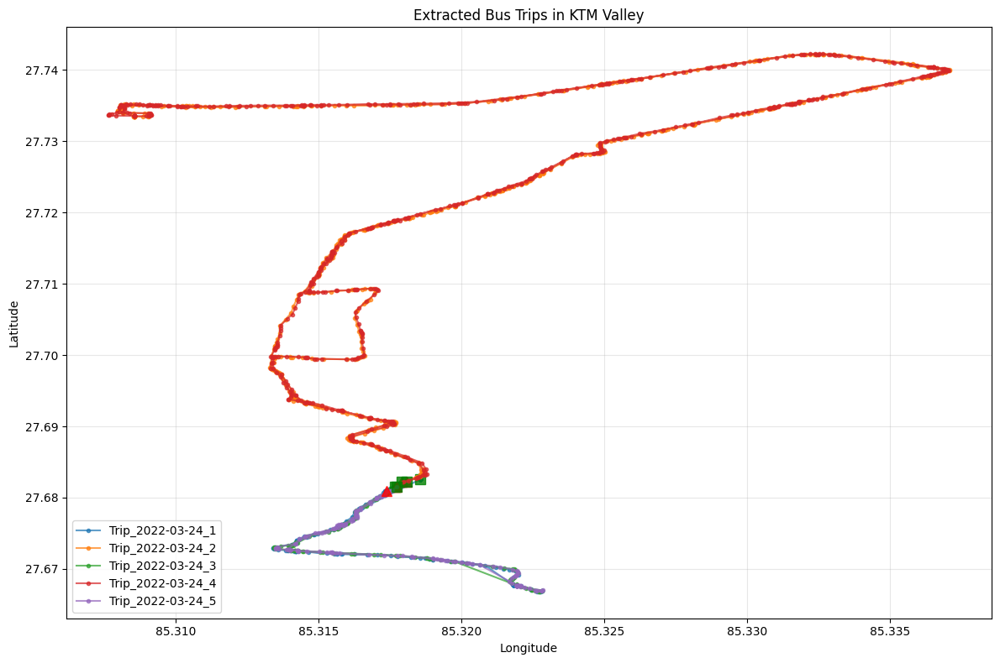

Creating Trip ID vs Data Point ID visualizations...


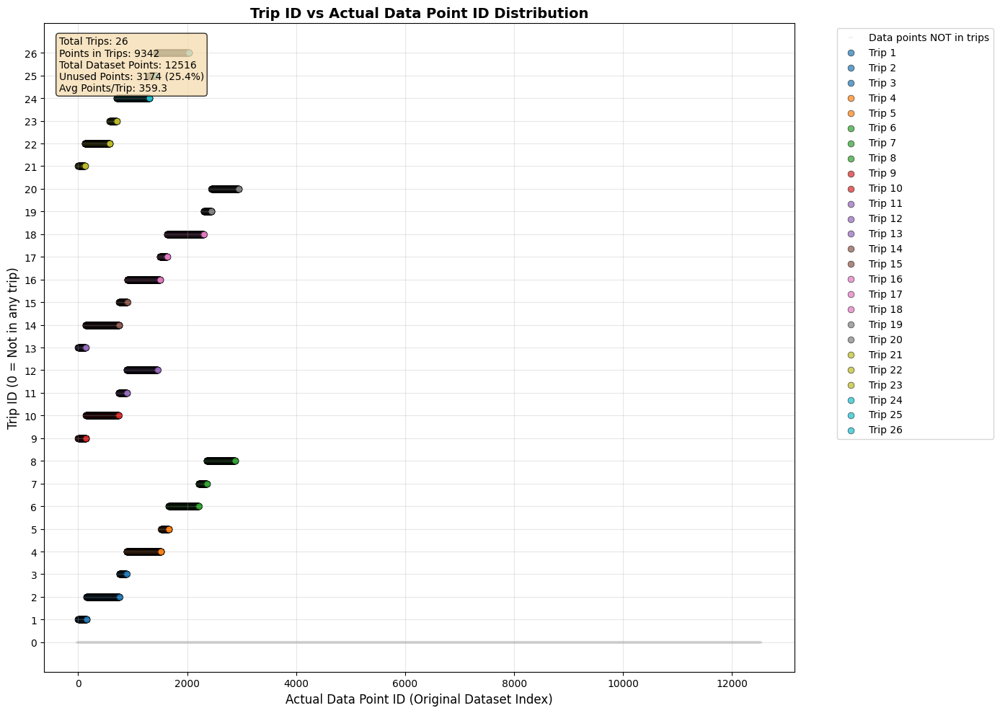


Detailed Analysis of Unused Data Points:
Total unused points: 9570

First 10 unused indices: [2946, 2947, 2948, 2949, 2950, 2951, 2952, 2953, 2954, 2955]
Last 10 unused indices: [12506, 12507, 12508, 12509, 12510, 12511, 12512, 12513, 12514, 12515]


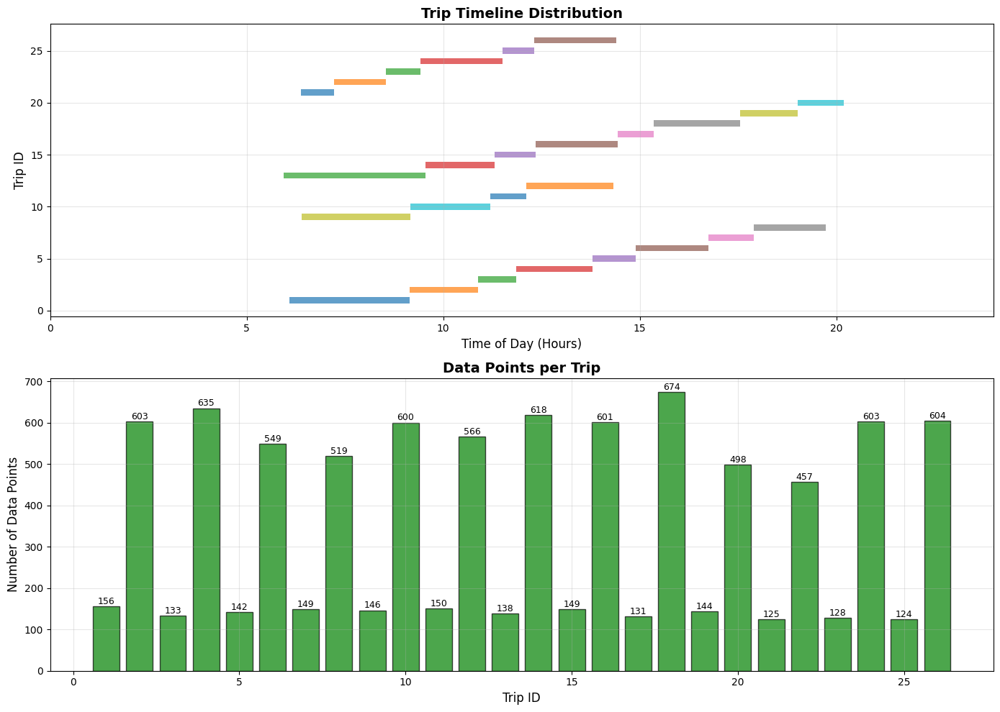

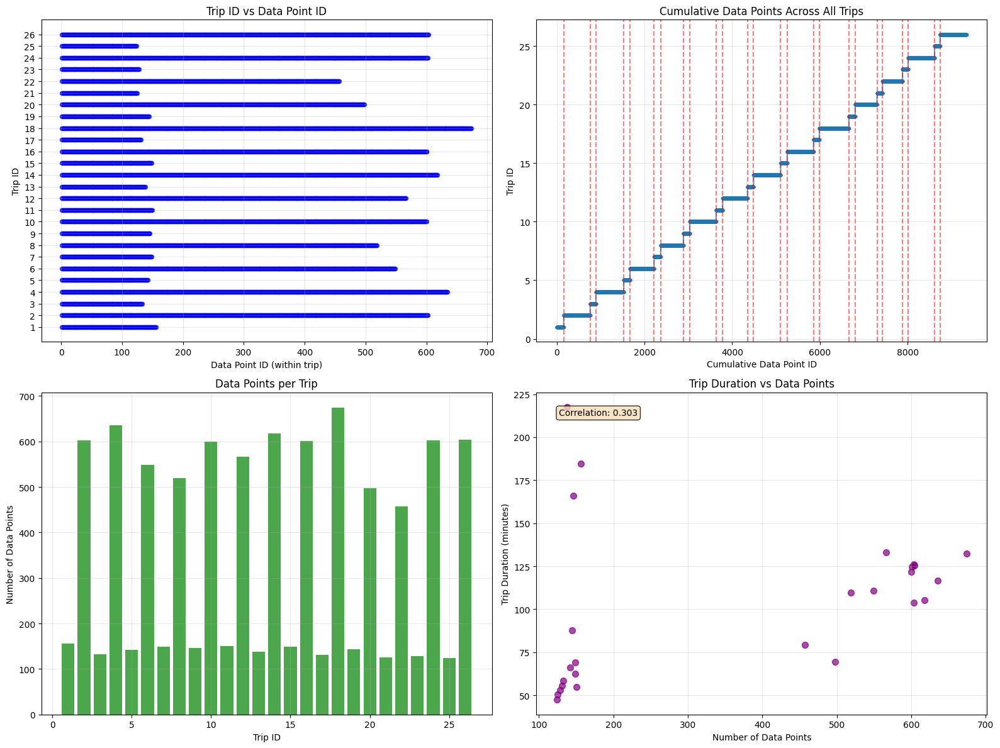

In [20]:
import pandas as pd
import numpy as np
from datetime import datetime
from geopy.distance import geodesic
import matplotlib.pyplot as plt

def extract_trips_from_gps_data(df, proximity_threshold=0.2, min_trip_duration_minutes=30, min_trip_points=10):
    """
    Extract circular trips from GPS data where trips start and end at similar locations.
    
    Parameters:
    - df: DataFrame with GPS data
    - proximity_threshold: Distance threshold in km to consider two points as "same location"
    - min_trip_duration_minutes: Minimum duration for a valid trip
    - min_trip_points: Minimum number of GPS points for a valid trip
    
    Returns:
    - List of DataFrames, each representing a trip
    """
    
    # Ensure the data is sorted by time
    df_sorted = df.copy()
    df_sorted['Data Actual Time'] = pd.to_datetime(df_sorted['Data Actual Time'], format='%d-%m-%Y %I:%M:%S %p')
    df_sorted = df_sorted.sort_values('Data Actual Time').reset_index(drop=True)
    
    # Add date column for daily grouping
    df_sorted['Date'] = df_sorted['Data Actual Time'].dt.date
    
    trips = []
    
    # Process each day separately
    for date in df_sorted['Date'].unique():
        daily_data = df_sorted[df_sorted['Date'] == date].copy().reset_index(drop=True)
        
        if len(daily_data) < min_trip_points:
            continue
            
        # Find potential trip start/end points
        trip_starts = []
        current_trip_start = 0
        
        for i in range(1, len(daily_data)):
            # Check if we've returned to starting location
            start_lat = daily_data.iloc[current_trip_start]['Latitude']
            start_lon = daily_data.iloc[current_trip_start]['Longitude']
            current_lat = daily_data.iloc[i]['Latitude']
            current_lon = daily_data.iloc[i]['Longitude']
            
            # Calculate distance between start and current point
            distance = geodesic((start_lat, start_lon), (current_lat, current_lon)).kilometers
            
            # If we're back near the starting point
            if distance <= proximity_threshold:
                # Check if trip duration and point count meet minimum requirements
                trip_duration = (daily_data.iloc[i]['Data Actual Time'] - 
                               daily_data.iloc[current_trip_start]['Data Actual Time']).total_seconds() / 60
                
                if trip_duration >= min_trip_duration_minutes and (i - current_trip_start + 1) >= min_trip_points:
                    # Extract the trip
                    trip_data = daily_data.iloc[current_trip_start:i+1].copy()
                    trip_data['Trip_ID'] = f"Trip_{date}_{len(trips)+1}"
                    trips.append(trip_data)
                    
                    # Start looking for next trip
                    current_trip_start = i
                    
    return trips

def analyze_trips(trips):
    """
    Analyze extracted trips and provide summary statistics.
    """
    if not trips:
        print("No trips found!")
        return
    
    print(f"Total trips extracted: {len(trips)}")
    print("\nTrip Analysis:")
    print("-" * 50)
    
    for i, trip in enumerate(trips):
        trip_id = trip['Trip_ID'].iloc[0]
        start_time = trip['Data Actual Time'].iloc[0]
        end_time = trip['Data Actual Time'].iloc[-1]
        duration = (end_time - start_time).total_seconds() / 60  # minutes
        
        # Calculate trip distance (approximate)
        total_distance = 0
        for j in range(1, len(trip)):
            lat1, lon1 = trip.iloc[j-1]['Latitude'], trip.iloc[j-1]['Longitude']
            lat2, lon2 = trip.iloc[j]['Latitude'], trip.iloc[j]['Longitude']
            total_distance += geodesic((lat1, lon1), (lat2, lon2)).kilometers
        
        print(f"{trip_id}:")
        print(f"  Start: {start_time}")
        print(f"  End: {end_time}")
        print(f"  Duration: {duration:.1f} minutes")
        print(f"  Points: {len(trip)}")
        print(f"  Approximate distance: {total_distance:.2f} km")
        
        # Check circularity
        start_lat, start_lon = trip.iloc[0]['Latitude'], trip.iloc[0]['Longitude']
        end_lat, end_lon = trip.iloc[-1]['Latitude'], trip.iloc[-1]['Longitude']
        circularity_distance = geodesic((start_lat, start_lon), (end_lat, end_lon)).kilometers
        print(f"  Start-End distance: {circularity_distance:.3f} km")
        print()

def plot_trips(trips, max_trips_to_plot=5):
    """
    Plot the extracted trips on a map-like visualization.
    """
    if not trips:
        print("No trips to plot!")
        return
    
    plt.figure(figsize=(12, 8))
    
    # Plot up to max_trips_to_plot trips
    for i, trip in enumerate(trips[:max_trips_to_plot]):
        trip_id = trip['Trip_ID'].iloc[0]
        plt.plot(trip['Longitude'], trip['Latitude'], 'o-', 
                label=trip_id, alpha=0.7, markersize=3)
        
        # Mark start and end points
        plt.plot(trip['Longitude'].iloc[0], trip['Latitude'].iloc[0], 
                's', markersize=8, color='green', alpha=0.8)
        plt.plot(trip['Longitude'].iloc[-1], trip['Latitude'].iloc[-1], 
                '^', markersize=8, color='red', alpha=0.8)
    
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Extracted Bus Trips in KTM Valley')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


def plot_trip_vs_datapoint(trips, original_df=None):
    """
    Plot Trip ID vs Actual Data Point ID graph showing the distribution of data points across trips.
    This uses the original index from the dataset to show which data points are NOT in any trip.
    
    Parameters:
    - trips: List of trip DataFrames
    - original_df: Original DataFrame to get the full range of data point IDs
    """
    if not trips:
        print("No trips to plot!")
        return
    
    # Prepare data for plotting
    trip_ids = []
    actual_data_point_ids = []
    
    for trip_idx, trip in enumerate(trips):
        trip_id = trip_idx + 1  # Use numeric trip ID for plotting
        # Get the original indices from the trip data
        for original_idx in trip.index:
            trip_ids.append(trip_id)
            actual_data_point_ids.append(original_idx)
    
    # Create the plot
    plt.figure(figsize=(14, 10))
    
    # If original_df is provided, show the full context
    if original_df is not None:
        # Plot all data points in light gray to show the full dataset
        all_indices = list(original_df.index)
        plt.scatter(all_indices, [0] * len(all_indices), alpha=0.3, s=15, c='lightgray', 
                   label='Data points NOT in trips', marker='_')
    
    # Scatter plot for trip data points
    colors = plt.cm.tab10(np.linspace(0, 1, len(trips)))  # Different colors for each trip
    
    for trip_idx, trip in enumerate(trips):
        trip_id = trip_idx + 1
        trip_indices = list(trip.index)
        trip_ids_for_this_trip = [trip_id] * len(trip_indices)
        
        plt.scatter(trip_indices, trip_ids_for_this_trip, alpha=0.7, s=40, 
                   c=[colors[trip_idx]], label=f'Trip {trip_id}', 
                   edgecolors='black', linewidth=0.5)
    
    # Customize the plot
    plt.xlabel('Actual Data Point ID (Original Dataset Index)', fontsize=12)
    plt.ylabel('Trip ID', fontsize=12)
    plt.title('Trip ID vs Actual Data Point ID Distribution', fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3)
    
    # Set y-axis to show all trip IDs plus 0 for non-trip points
    if original_df is not None:
        plt.yticks(list(range(0, len(trips) + 1)))
        plt.ylabel('Trip ID (0 = Not in any trip)', fontsize=12)
    else:
        plt.yticks(range(1, len(trips) + 1))
    
    # Add legend
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Add statistics
    total_trip_points = len(actual_data_point_ids)
    total_original_points = len(original_df) if original_df is not None else total_trip_points
    unused_points = total_original_points - total_trip_points
    avg_points_per_trip = total_trip_points / len(trips) if trips else 0
    
    stats_text = f'Total Trips: {len(trips)}\n'
    stats_text += f'Points in Trips: {total_trip_points}\n'
    if original_df is not None:
        stats_text += f'Total Dataset Points: {total_original_points}\n'
        stats_text += f'Unused Points: {unused_points} ({unused_points/total_original_points*100:.1f}%)\n'
    stats_text += f'Avg Points/Trip: {avg_points_per_trip:.1f}'
    
    plt.text(0.02, 0.98, stats_text, 
             transform=plt.gca().transAxes, fontsize=10, verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed analysis of unused points
    if original_df is not None and unused_points > 0:
        used_indices = set(actual_data_point_ids)
        unused_indices = [idx for idx in original_df.index if idx not in used_indices]
        
        print(f"\nDetailed Analysis of Unused Data Points:")
        print(f"Total unused points: {len(unused_indices)}")
        # print(f"Unused indices: {sorted(unused_indices)}")
        
        if len(unused_indices) <= 20:  # Show details for small numbers
            print("\nUnused data points details:")
            for idx in sorted(unused_indices):
                row = original_df.loc[idx]
                print(f"Index {idx}: {row['Actual Time Data String']} - "
                      f"Lat: {row['Latitude']:.6f}, Lon: {row['Longitude']:.6f}")
        else:
            print(f"\nFirst 10 unused indices: {sorted(unused_indices)[:10]}")
            print(f"Last 10 unused indices: {sorted(unused_indices)[-10:]}")



def plot_trip_timeline(trips):
    """
    Alternative visualization: Plot trips as horizontal bars showing their timeline and data point distribution.
    """
    if not trips:
        print("No trips to plot!")
        return
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10))
    
    # Plot 1: Trip timeline
    for trip_idx, trip in enumerate(trips):
        trip_id = trip_idx + 1
        start_time = trip['Data Actual Time'].iloc[0]
        end_time = trip['Data Actual Time'].iloc[-1]
        
        # Convert to hours for plotting
        start_hour = start_time.hour + start_time.minute/60
        end_hour = end_time.hour + end_time.minute/60
        
        ax1.barh(trip_id, end_hour - start_hour, left=start_hour, height=0.6, 
                alpha=0.7, label=f'Trip {trip_id}')
    
    ax1.set_xlabel('Time of Day (Hours)', fontsize=12)
    ax1.set_ylabel('Trip ID', fontsize=12)
    ax1.set_title('Trip Timeline Distribution', fontsize=14, fontweight='bold')
    ax1.grid(True, alpha=0.3)
    ax1.set_xlim(0, 24)
    
    # Plot 2: Data points per trip
    trip_nums = []
    point_counts = []
    
    for trip_idx, trip in enumerate(trips):
        trip_nums.append(trip_idx + 1)
        point_counts.append(len(trip))
    
    bars = ax2.bar(trip_nums, point_counts, alpha=0.7, color='green', edgecolor='black')
    ax2.set_xlabel('Trip ID', fontsize=12)
    ax2.set_ylabel('Number of Data Points', fontsize=12)
    ax2.set_title('Data Points per Trip', fontsize=14, fontweight='bold')
    ax2.grid(True, alpha=0.3)
    
    # Add value labels on bars
    for bar, count in zip(bars, point_counts):
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                f'{count}', ha='center', va='bottom', fontsize=9)
    
    plt.tight_layout()
    plt.show()

def plot_comprehensive_trip_analysis(trips):
    """
    Comprehensive visualization combining multiple perspectives of trip data.
    """
    if not trips:
        print("No trips to plot!")
        return
    
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))
    
    # Plot 1: Trip ID vs Data Point ID (scatter)
    trip_ids = []
    data_point_ids = []
    
    for trip_idx, trip in enumerate(trips):
        trip_id = trip_idx + 1
        for point_idx in range(len(trip)):
            trip_ids.append(trip_id)
            data_point_ids.append(point_idx + 1)
    
    ax1.scatter(data_point_ids, trip_ids, alpha=0.6, s=20, c='blue')
    ax1.set_xlabel('Data Point ID (within trip)')
    ax1.set_ylabel('Trip ID')
    ax1.set_title('Trip ID vs Data Point ID')
    ax1.grid(True, alpha=0.3)
    ax1.set_yticks(range(1, len(trips) + 1))
    
    # Plot 2: Cumulative data points across trips
    cumulative_points = []
    trip_boundaries = [0]
    
    for trip in trips:
        if cumulative_points:
            cumulative_points.extend(range(cumulative_points[-1] + 1, cumulative_points[-1] + len(trip) + 1))
        else:
            cumulative_points.extend(range(1, len(trip) + 1))
        trip_boundaries.append(cumulative_points[-1])
    
    trip_ids_cumulative = []
    for trip_idx, trip in enumerate(trips):
        trip_ids_cumulative.extend([trip_idx + 1] * len(trip))
    
    ax2.plot(cumulative_points, trip_ids_cumulative, 'o-', markersize=3, alpha=0.7)
    for boundary in trip_boundaries[1:-1]:  # Skip first (0) and last
        ax2.axvline(x=boundary, color='red', linestyle='--', alpha=0.5)
    
    ax2.set_xlabel('Cumulative Data Point ID')
    ax2.set_ylabel('Trip ID')
    ax2.set_title('Cumulative Data Points Across All Trips')
    ax2.grid(True, alpha=0.3)
    
    # Plot 3: Data points per trip (bar chart)
    trip_nums = list(range(1, len(trips) + 1))
    point_counts = [len(trip) for trip in trips]
    
    bars = ax3.bar(trip_nums, point_counts, alpha=0.7, color='green')
    ax3.set_xlabel('Trip ID')
    ax3.set_ylabel('Number of Data Points')
    ax3.set_title('Data Points per Trip')
    ax3.grid(True, alpha=0.3)
    
    # Plot 4: Trip duration vs data points
    durations = []
    for trip in trips:
        start_time = trip['Data Actual Time'].iloc[0]
        end_time = trip['Data Actual Time'].iloc[-1]
        duration = (end_time - start_time).total_seconds() / 60  # minutes
        durations.append(duration)
    
    ax4.scatter(point_counts, durations, alpha=0.7, s=50, c='purple')
    ax4.set_xlabel('Number of Data Points')
    ax4.set_ylabel('Trip Duration (minutes)')
    ax4.set_title('Trip Duration vs Data Points')
    ax4.grid(True, alpha=0.3)
    
    # Add correlation coefficient
    correlation = np.corrcoef(point_counts, durations)[0, 1]
    ax4.text(0.05, 0.95, f'Correlation: {correlation:.3f}', 
             transform=ax4.transAxes, fontsize=10, verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    plt.tight_layout()
    plt.show()
# Example usage:
def main():
    """
    Main function to demonstrate trip extraction.
    Replace this with your actual data loading.
    """
    
    # Sample data structure (replace with your actual data loading)
    # df = pd.read_csv('your_gps_data.csv')
    
    df = pd.read_csv("/Users/Subidha/Downloads/finalOutput.csv")
    # Extract trips
    trips = extract_trips_from_gps_data(df, 
                                       proximity_threshold=0.1,  # 100m radius
                                       min_trip_duration_minutes=30,
                                       min_trip_points=100)
    
    # Analyze trips
    analyze_trips(trips)
    
    # Plot trips (if you have matplotlib installed)
    plot_trips(trips)
    
    return trips

# Advanced trip extraction with additional features
def enhanced_trip_extraction(df, proximity_threshold=0.1, min_trip_duration_minutes=30, 
                           min_trip_points=10, speed_threshold=5, idle_time_threshold=300):
    """
    Enhanced trip extraction that considers speed and idle times.
    
    Additional parameters:
    - speed_threshold: Minimum average speed (km/h) for a valid trip
    - idle_time_threshold: Maximum idle time (seconds) before considering trip ended
    """
    
    df_sorted = df.copy()
    df_sorted['Data Actual Time'] = pd.to_datetime(df_sorted['Data Actual Time'], format='%d-%m-%Y %I:%M:%S %p')
    df_sorted = df_sorted.sort_values('Data Actual Time').reset_index(drop=True)
    df_sorted['Date'] = df_sorted['Data Actual Time'].dt.date
    
    trips = []
    
    for date in df_sorted['Date'].unique():
        daily_data = df_sorted[df_sorted['Date'] == date].copy().reset_index(drop=True)
        
        if len(daily_data) < min_trip_points:
            continue
        
        i = 0
        while i < len(daily_data) - min_trip_points:
            trip_start_idx = i
            
            # Look for trip completion
            for j in range(i + min_trip_points, len(daily_data)):
                start_lat = daily_data.iloc[trip_start_idx]['Latitude']
                start_lon = daily_data.iloc[trip_start_idx]['Longitude']
                current_lat = daily_data.iloc[j]['Latitude']
                current_lon = daily_data.iloc[j]['Longitude']
                
                distance = geodesic((start_lat, start_lon), (current_lat, current_lon)).kilometers
                
                if distance <= proximity_threshold:
                    # Check trip validity
                    trip_data = daily_data.iloc[trip_start_idx:j+1].copy()
                    trip_duration = (trip_data['Data Actual Time'].iloc[-1] - 
                                   trip_data['Data Actual Time'].iloc[0]).total_seconds() / 60
                    
                    if trip_duration >= min_trip_duration_minutes:
                        # Calculate average speed
                        total_distance = 0
                        for k in range(1, len(trip_data)):
                            lat1, lon1 = trip_data.iloc[k-1]['Latitude'], trip_data.iloc[k-1]['Longitude']
                            lat2, lon2 = trip_data.iloc[k]['Latitude'], trip_data.iloc[k]['Longitude']
                            total_distance += geodesic((lat1, lon1), (lat2, lon2)).kilometers
                        
                        avg_speed = (total_distance / trip_duration) * 60  # km/h
                        
                        if avg_speed >= speed_threshold:
                            trip_data['Trip_ID'] = f"Trip_{date}_{len(trips)+1}"
                            trips.append(trip_data)
                            i = j  # Move to end of current trip
                            break
            else:
                i += 1
    
    return trips

if __name__ == "__main__":
    # Run the main function
    trips = main()
    if trips:
        print("Creating Trip ID vs Data Point ID visualizations...")
        plot_trip_vs_datapoint(trips, original_df=pd.read_csv("/Users/Subidha/Downloads/finalOutput.csv"))
        plot_trip_timeline(trips)
        plot_comprehensive_trip_analysis(trips)

In [14]:

import pandas as pd
import numpy as np
from datetime import datetime
from geopy.distance import geodesic
import matplotlib.pyplot as plt
import folium
import os

# --------- Step 1: Trip Extraction Function ---------
def extract_trips_from_gps_data(df, proximity_threshold=0.2, min_trip_duration_minutes=30, min_trip_points=10):
    df_sorted = df.copy()
    df_sorted['Data Actual Time'] = pd.to_datetime(df_sorted['Data Actual Time'], format='%d-%m-%Y %I:%M:%S %p')
    df_sorted = df_sorted.sort_values('Data Actual Time').reset_index(drop=True)
    df_sorted['Date'] = df_sorted['Data Actual Time'].dt.date
    
    trips = []
    
    for date in df_sorted['Date'].unique():
        daily_data = df_sorted[df_sorted['Date'] == date].copy().reset_index(drop=True)
        
        if len(daily_data) < min_trip_points:
            continue
            
        current_trip_start = 0
        
        for i in range(1, len(daily_data)):
            start_lat = daily_data.iloc[current_trip_start]['Latitude']
            start_lon = daily_data.iloc[current_trip_start]['Longitude']
            current_lat = daily_data.iloc[i]['Latitude']
            current_lon = daily_data.iloc[i]['Longitude']
            
            distance = geodesic((start_lat, start_lon), (current_lat, current_lon)).kilometers
            
            if distance <= proximity_threshold:
                trip_duration = (daily_data.iloc[i]['Data Actual Time'] - 
                                 daily_data.iloc[current_trip_start]['Data Actual Time']).total_seconds() / 60
                
                if trip_duration >= min_trip_duration_minutes and (i - current_trip_start + 1) >= min_trip_points:
                    trip_data = daily_data.iloc[current_trip_start:i+1].copy()
                    trip_data['Trip_ID'] = f"Trip_{date}_{len(trips)+1}"
                    trips.append(trip_data)
                    current_trip_start = i
    
    return trips

# --------- Step 2: Load Data and Extract Trips ---------
file_path = "data/finalOutput.csv"  # Replace with your file path
df = pd.read_csv(file_path)

# Extract trips
trips = extract_trips_from_gps_data(df, proximity_threshold=0.1, min_trip_duration_minutes=30, min_trip_points=100)
print(f"✅ Extracted {len(trips)} trips")

# --------- Step 3: Divide Trips into Paths ---------
trip_paths = {}

for trip in trips:
    trip_id = trip['Trip_ID'].iloc[0]
    path = list(zip(trip['Latitude'], trip['Longitude']))
    trip_paths[trip_id] = path

print(f"✅ Divided into {len(trip_paths)} paths")

# --------- Step 4: Visualize on Map ---------
# Use first trip's start location to center map
first_trip_coords = list(trip_paths.values())[0][0]
map_center = [first_trip_coords[0], first_trip_coords[1]]
trip_map = folium.Map(location=map_center, zoom_start=13)

for trip_id, path in trip_paths.items():
    folium.PolyLine(path, color='blue', weight=3, opacity=0.6, tooltip=trip_id).add_to(trip_map)
    # Add markers for start and end
    folium.Marker(path[0], popup=f"{trip_id} Start", icon=folium.Icon(color='green')).add_to(trip_map)
    folium.Marker(path[-1], popup=f"{trip_id} End", icon=folium.Icon(color='red')).add_to(trip_map)
    print(path[0], path[-1])

trip_map.save("trip_paths_map.html")
print("🗺 Map saved as trip_paths_map.html")

# --------- Step 5: Export Each Trip as CSV ---------
export_dir = "trip_paths_csv"
os.makedirs(export_dir, exist_ok=True)

for trip in trips:
    trip_id = trip['Trip_ID'].iloc[0]
    trip[['Data Actual Time', 'Latitude', 'Longitude']].to_csv(f"{export_dir}/{trip_id}.csv", index=False)

print(f"📁 Exported all trips to '{export_dir}/'")


✅ Extracted 26 trips
✅ Divided into 26 paths
(27.6825533, 85.3185583) (27.68218, 85.3179016)
(27.68218, 85.3179016) (27.682255, 85.3180983)
(27.682255, 85.3180983) (27.6815416, 85.3176683)
(27.6815416, 85.3176683) (27.6814766, 85.3177433)
(27.6814766, 85.3177433) (27.6808983, 85.31739)
(27.6808983, 85.31739) (27.6816633, 85.31781)
(27.6816633, 85.31781) (27.6808483, 85.317395)
(27.6808483, 85.317395) (27.6813083, 85.3176583)
(27.679625, 85.317835) (27.6799333, 85.3169783)
(27.6799333, 85.3169783) (27.680695, 85.3174116)
(27.680695, 85.3174116) (27.6800566, 85.3170799)
(27.6800566, 85.3170799) (27.6803583, 85.31727)
(27.679495, 85.317425) (27.6796116, 85.31694)
(27.6796116, 85.31694) (27.6804216, 85.3173116)
(27.6804216, 85.3173116) (27.6801383, 85.317055)
(27.6801383, 85.317055) (27.6804833, 85.3173499)
(27.6804833, 85.3173499) (27.6797, 85.316875)
(27.6797, 85.316875) (27.6804766, 85.3173366)
(27.6804766, 85.3173366) (27.679975, 85.3170483)
(27.679975, 85.3170483) (27.68064, 85.317494

In [12]:
print(trip_paths.items())

dict_items([('Trip_2022-03-24_1', [(27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6825533, 85.3185583), (27.6785383, 85.3165433), (27.67832, 85.3164516), (27.6774366, 85.3162883), (27.67691, 85.3162116), (27.67691, 85.3162116), (27.6760516, 85.315805), (27.67583, 85.315705), (27.675495, 85.31553), (27.6747666, 85.3148466), (27.6745916, 85.

Transition Probability Matrix:
next_state     accelerating  cruising      idle  retarding
vehicle_state                                             
accelerating       0.571006  0.088546  0.067625   0.272823
cruising           0.338012  0.192982  0.105263   0.363743
idle               0.355174  0.000000  0.623344   0.021482
retarding          0.181180  0.065554  0.155056   0.598210


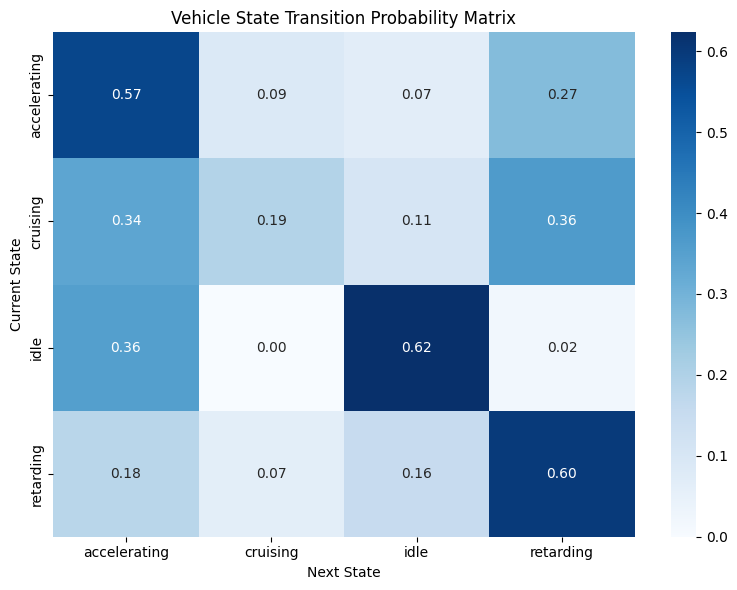

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Sample data
df = pd.read_csv("data/finalOutput.csv")
# Create DataFrame
# df = pd.DataFrame(data)

# Shift the vehicle_state column to get transitions
df['next_state'] = df['vehicle_state'].shift(-1)

# Drop rows where next_state is NaN (i.e., the last row)
df = df.dropna()

# Compute transition counts
transition_counts = pd.crosstab(df['vehicle_state'], df['next_state'])

# Normalize to get transition probabilities
transition_prob = transition_counts.div(transition_counts.sum(axis=1), axis=0)

# Display TPM
print("Transition Probability Matrix:")
print(transition_prob)

# Visualization
plt.figure(figsize=(8, 6))
sns.heatmap(transition_prob, annot=True, cmap='Blues', fmt=".2f", cbar=True)
plt.title("Vehicle State Transition Probability Matrix")
plt.xlabel("Next State")
plt.ylabel("Current State")
plt.tight_layout()
plt.show()
